# Pre-processing Soil Properties Data

### Imports

In [1]:
import numpy as np
import pandas as pd
import sklearn as sk
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from matplotlib import figure

%matplotlib inline

### Import data as pandas DataFrame:
data had to first be converted from .rds to .csv in R studio because of an encoding error. The following dataframe reads
the data from a CSV.

In [2]:
import pylab as p

cols = ['site_key',
        'longitude_decimal_degrees',
        'latitude_decimal_degrees',
        'clay_tot_psa',
        'silt_tot_psa',
        'sand_tot_psa',
        'oc',
        'oc_d',
        'c_tot',
        'n_tot',
        'ph_kcl',
        'ph_h2o',
        'ph_cacl2',
        'cec_sum',
        'cec_nh4',
        'ecec',
        'wpg2',
        'db_od',
        'ca_ext',
        'mg_ext',
        'na_ext',
        'k_ext',
        'ec_satp',
        'ec_12pre']

df = pd.read_csv('./data/unprocessed/soil_properties/soil_data.csv', usecols=cols)

C:\Users\liams\anaconda3\envs\soil-dataset-exploration\lib\site-packages\IPython\core\interactiveshell.py:3444: DtypeWarning: Columns (1) have mixed types.Specify dtype option on import or set low_memory=False.
  exec(code_obj, self.user_global_ns, self.user_ns)


### Column Name Key:
* clay_tot_psa: Clay, Total in % wt for <2 mm soil fraction
* silt_tot_psa: Silt, Total in % wt for <2 mm soil fraction
* sand_tot_psa: Sand, Total in % wt for <2 mm soil fraction
* oc: Carbon, Organic in g/kg for <2 mm soil fraction
* oc_d: Soil organic carbon density in kg/m3
* c_tot: Carbon, Total in g/kg for <2 mm soil fraction
* n_tot: Nitrogen, Total NCS in g/kg for <2 mm soil fraction
* ph_kcl: pH, KCl Suspension for <2 mm soil fraction
* ph_h2o: pH, 1:1 Soil-Water Suspension for <2 mm soil fraction
* ph_cacl2: pH, CaCl2 Suspension for <2 mm soil fraction
* cec_sum: Cation Exchange Capacity, Summary, in cmol(+)/kg for <2 mm soil fraction
* cec_nh4: Cation Exchange Capacity, NH4 prep, in cmol(+)/kg for <2 mm soil fraction
* ecec: Cation Exchange Capacity, Effective, CMS derived value default, standa prep in cmol(+)/kg for <2 mm soil fraction
* wpg2: Coarse fragments in % wt for >2 mm soil fraction
* db_od: Bulk density (Oven Dry) in g/cm3 (4A1h)
* ca_ext: Calcium, Extractable in mg/kg for <2 mm soil fraction (usually Mehlich3)
* mg_ext: Magnesium, Extractable in mg/kg for <2 mm soil fraction (usually Mehlich3)
* na_ext: Sodium, Extractable in mg/kg for <2 mm soil fraction (usually Mehlich3)
* k_ext: Potassium, Extractable in mg/kg for <2 mm soil fraction (usually Mehlich3)
* ec_satp: Electrical Conductivity, Saturation Extract in dS/m for <2 mm soil fraction
* ec_12pre: Electrical Conductivity, Predict, 1:2 (w/w) in dS/m for <2 mm soil fraction

In [3]:
df

,site_key,longitude_decimal_degrees,latitude_decimal_degrees,clay_tot_psa,silt_tot_psa,sand_tot_psa,oc,oc_d,c_tot,n_tot,...,cec_nh4,ecec,wpg2,db_od,ca_ext,mg_ext,na_ext,k_ext,ec_satp,ec_12pre
0,icr006475,36.435982,-6.088750,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,89.5,42.71,306.30,0.053,NaN
1,icr006586,36.457722,-6.055750,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,636.7,40.83,1186.00,0.193,NaN
2,icr007929,37.493351,-5.339337,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,428.5,42.94,72.57,0.305,NaN
3,icr008008,37.515327,-5.333700,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,222.5,20.73,274.60,0.053,NaN
4,icr010198,35.191799,-11.087100,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,76.5,49.31,91.76,0.032,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
634959,ZW0067,31.750000,-19.800000,7.0,11.0,82.0,1.4,NaN,NaN,0.1,...,NaN,NaN,NaN,NaN,40.0,36.3,46.00,39.10,0.100,NaN
634960,ZW0067,31.750000,-19.800000,7.0,29.0,64.0,1.2,NaN,NaN,0.1,...,NaN,NaN,NaN,NaN,NaN,36.3,46.00,39.10,0.100,NaN
634961,ZW0067,31.750000,-19.800000,13.0,10.0,77.0,0.5,NaN,NaN,0.3,...,NaN,NaN,NaN,NaN,NaN,36.3,46.00,39.10,0.100,NaN
634962,ZW0067,31.750000,-19.800000,27.0,69.0,4.0,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,0.64,NaN,NaN,NaN,NaN,NaN,NaN


### filling na, and removing all data that is not contained within washington

In [4]:
df = df[(df['latitude_decimal_degrees'] >= 45) &
        (df['latitude_decimal_degrees'] <= 49) &
        (df['longitude_decimal_degrees'] >= -125) &
        (df['longitude_decimal_degrees'] <= -116)]
df

,site_key,longitude_decimal_degrees,latitude_decimal_degrees,clay_tot_psa,silt_tot_psa,sand_tot_psa,oc,oc_d,c_tot,n_tot,...,cec_nh4,ecec,wpg2,db_od,ca_ext,mg_ext,na_ext,k_ext,ec_satp,ec_12pre
115684,687,-123.73000,48.63000,NaN,NaN,NaN,432.8,69.20,NaN,12.9,...,NaN,NaN,0.0,0.16,8946.0,897.82,48.3,969.68,NaN,NaN
115685,687,-123.73000,48.63000,NaN,NaN,NaN,29.6,36.70,NaN,NaN,...,NaN,NaN,0.0,1.24,736.0,76.23,11.5,78.20,NaN,NaN
115686,687,-123.73000,48.63000,NaN,NaN,NaN,30.0,16.10,NaN,NaN,...,NaN,NaN,48.0,1.03,328.0,35.09,11.5,62.56,NaN,NaN
115687,687,-123.73000,48.63000,NaN,NaN,NaN,11.0,8.29,NaN,NaN,...,NaN,NaN,48.0,1.45,NaN,NaN,NaN,NaN,NaN,NaN
115692,689,-123.52000,48.83000,NaN,NaN,NaN,422.6,67.60,NaN,10.1,...,NaN,NaN,0.0,0.16,7282.0,949.85,48.3,1126.08,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
631448,US0366,-123.09861,45.53472,21.0,72.0,7.0,13.5,19.20,NaN,NaN,...,NaN,NaN,NaN,1.42,1620.0,206.00,46.0,430.00,0.1,NaN
631449,US0366,-123.09861,45.53472,22.0,72.0,6.0,4.1,5.99,NaN,NaN,...,NaN,NaN,NaN,1.46,920.0,133.00,46.0,274.00,0.1,NaN
631450,US0366,-123.09861,45.53472,22.0,71.0,7.0,1.9,3.02,NaN,NaN,...,NaN,NaN,NaN,1.59,1620.0,254.00,46.0,196.00,0.1,NaN
631451,US0366,-123.09861,45.53472,22.0,72.0,6.0,1.7,2.33,NaN,NaN,...,NaN,NaN,NaN,1.37,2620.0,460.00,46.0,196.00,0.1,NaN


# TODO:
1. normalize data
2. create class variables

### average data taken from the same site

In [5]:
sites = df['site_key'].unique()
averaged_df = pd.DataFrame(columns=cols)

for index in range(len(sites)):
    site = sites[index]
    site_df = df[df['site_key'] == site]
    lat = site_df['latitude_decimal_degrees'].unique()[0]
    lon = site_df['longitude_decimal_degrees'].unique()[0]
    site_data_df = site_df.drop(['site_key', 'longitude_decimal_degrees', 'latitude_decimal_degrees'], axis=1)
    average_site_data_series = site_data_df.mean()
    average_site_data_series['site_key'] = site
    average_site_data_series['longitude_decimal_degrees'] = lon
    average_site_data_series['latitude_decimal_degrees'] = lat
    averaged_df = averaged_df.append(average_site_data_series, ignore_index=True)
averaged_df

,site_key,longitude_decimal_degrees,latitude_decimal_degrees,clay_tot_psa,silt_tot_psa,sand_tot_psa,oc,oc_d,c_tot,n_tot,...,cec_nh4,ecec,wpg2,db_od,ca_ext,mg_ext,na_ext,k_ext,ec_satp,ec_12pre
0,687,-123.73000,48.63000,NaN,NaN,NaN,125.850000,32.572500,NaN,12.900000,...,NaN,NaN,24.000000,0.970000,3336.666667,336.380000,23.766667,370.146667,NaN,NaN
1,689,-123.52000,48.83000,NaN,NaN,NaN,124.975000,35.565000,NaN,10.100000,...,NaN,NaN,15.000000,1.032500,3092.666667,383.570000,24.533333,458.773333,NaN,NaN
2,1122,-123.37000,48.48000,7.166667,30.500000,62.333333,65.142857,33.768571,NaN,5.142857,...,NaN,NaN,4.285714,1.108571,2144.571429,386.681429,66.371429,524.498571,NaN,NaN
3,1123,-124.45000,48.60000,8.200000,36.000000,55.800000,146.533333,66.251667,NaN,3.983333,...,NaN,NaN,4.166667,1.055000,788.666667,270.233333,43.700000,303.025000,NaN,NaN
4,2367,-123.36000,48.88000,10.500000,36.000000,53.500000,13.000000,15.210000,NaN,0.800000,...,NaN,NaN,3.750000,1.386667,1210.000000,189.566667,38.333333,97.750000,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1901,US0241,-118.55000,48.38333,2.500000,55.000000,42.500000,12.850000,11.305000,NaN,0.700000,...,NaN,NaN,10.000000,0.920000,860.000000,78.650000,23.000000,215.500000,0.1,NaN
1902,US0242,-118.96667,48.33333,2.500000,38.500000,59.000000,12.066667,11.078200,NaN,1.300000,...,NaN,NaN,18.800000,1.210000,823.333333,64.533333,61.333333,117.240000,0.1,NaN
1903,US0257,-123.44722,45.91389,22.200000,59.400000,18.400000,18.400000,17.853333,NaN,2.050000,...,NaN,NaN,11.000000,1.356667,740.000000,241.940000,NaN,273.800000,0.1,NaN
1904,US0284,-117.55417,46.95389,17.222222,76.555556,6.222222,9.744444,12.102222,NaN,0.925000,...,NaN,NaN,NaN,1.334444,4126.666667,524.111111,27.600000,260.622222,0.1,NaN


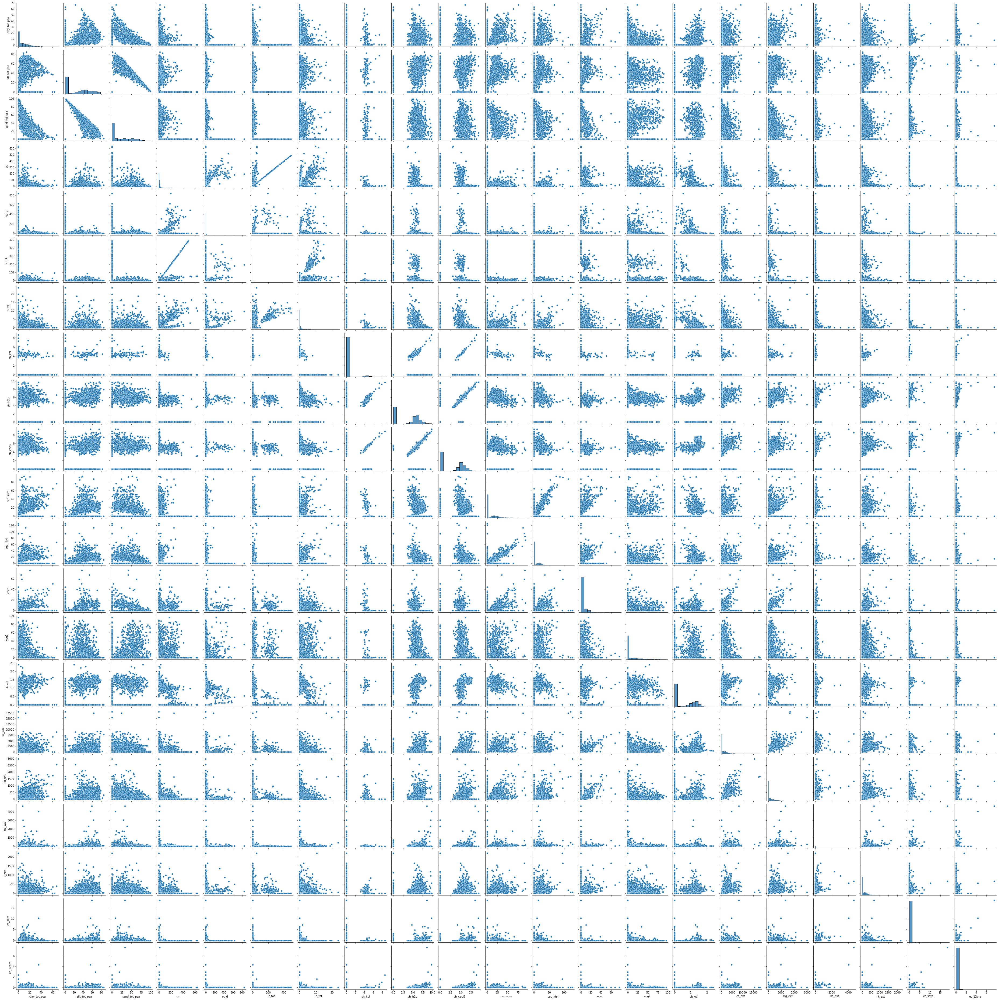

In [6]:
data = averaged_df.fillna(0)
data = data.drop(['site_key', 'longitude_decimal_degrees', 'latitude_decimal_degrees'], axis=1)
data
pairplot = sns.pairplot(data)
pairplot.savefig('soil_pairplot.png')

### Cluster data to find relationships described as features

12    0.452609
14    0.463755
15    0.472702
16    0.442431
17    0.429408
18    0.437517
19    0.441029
20    0.438819
21    0.430488
22    0.434217
23    0.430383
dtype: float64


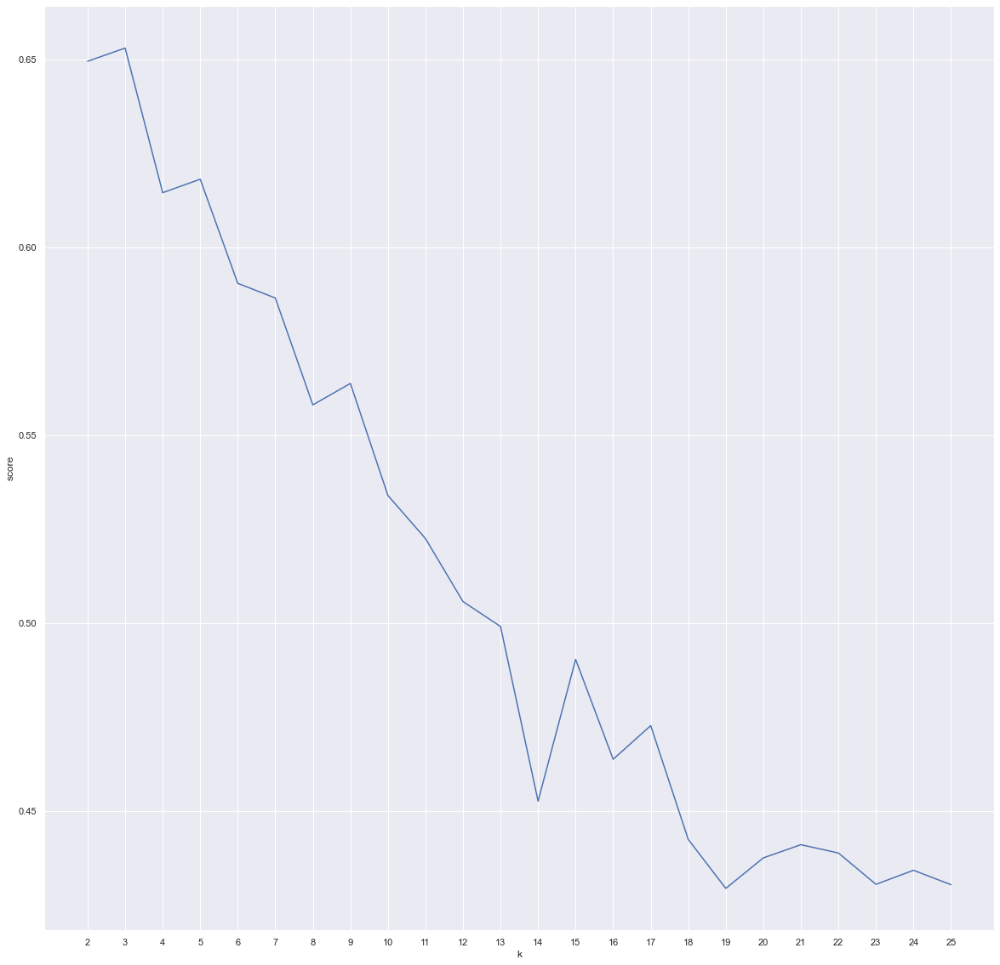

In [7]:
np.random.seed(42)
silhouette = []
k_clusters = []
clusters = []
kmax = 25

# dissimilarity would not be defined for a single cluster, thus, minimum number of clusters should be 2
for k in range(2, kmax+1):
  clustered_data = KMeans(n_clusters = k).fit(data)
  labels = clustered_data.labels_
  silhouette.append(silhouette_score(data, labels, metric = 'euclidean'))
  k_clusters.append(k)
  clusters.append(clustered_data)

sns.set(rc = {'figure.figsize': (20, 20)})
sns.lineplot(x=k_clusters, y=silhouette)
plt.xticks(k_clusters)
plt.xlabel('k')
plt.ylabel('score')

sil_series = pd.Series(silhouette)
print(sil_series[sil_series <= sil_series.min() + 0.05])

### Append labeled clusters to data

In [18]:
clusters[12]

KMeans(n_clusters=14)

In [19]:
data['cluster'] = clusters[12].labels_

In [20]:
clustered_dataset = pd.merge(averaged_df, data['cluster'], left_index=True, right_index=True)
clustered_dataset.head(10)

,site_key,longitude_decimal_degrees,latitude_decimal_degrees,clay_tot_psa,silt_tot_psa,sand_tot_psa,oc,oc_d,c_tot,n_tot,...,ecec,wpg2,db_od,ca_ext,mg_ext,na_ext,k_ext,ec_satp,ec_12pre,cluster
0,687,-123.73,48.63,NaN,NaN,NaN,125.850000,32.572500,NaN,12.900000,...,NaN,24.000000,0.970000,3336.666667,336.380000,23.766667,370.146667,NaN,NaN,4
1,689,-123.52,48.83,NaN,NaN,NaN,124.975000,35.565000,NaN,10.100000,...,NaN,15.000000,1.032500,3092.666667,383.570000,24.533333,458.773333,NaN,NaN,4
2,1122,-123.37,48.48,7.166667,30.500000,62.333333,65.142857,33.768571,NaN,5.142857,...,NaN,4.285714,1.108571,2144.571429,386.681429,66.371429,524.498571,NaN,NaN,1
3,1123,-124.45,48.60,8.200000,36.000000,55.800000,146.533333,66.251667,NaN,3.983333,...,NaN,4.166667,1.055000,788.666667,270.233333,43.700000,303.025000,NaN,NaN,9
4,2367,-123.36,48.88,10.500000,36.000000,53.500000,13.000000,15.210000,NaN,0.800000,...,NaN,3.750000,1.386667,1210.000000,189.566667,38.333333,97.750000,NaN,NaN,10
5,2368,-123.51,48.74,6.000000,36.666667,57.333333,62.428571,24.738857,NaN,2.142857,...,NaN,33.571429,1.191429,1726.666667,52.433333,19.166667,91.233333,NaN,NaN,0
6,2369,-123.49,48.84,3.750000,16.750000,79.500000,117.200000,28.008000,NaN,2.000000,...,NaN,31.600000,1.116000,1050.000000,87.725000,5.750000,68.425000,NaN,NaN,10
7,2370,-123.55,48.83,4.666667,42.666667,52.666667,54.250000,16.025000,NaN,2.000000,...,NaN,18.750000,0.995000,273.333333,20.166667,15.333333,39.100000,NaN,NaN,2
8,2374,-123.30,48.81,25.800000,43.200000,31.000000,87.833333,26.260000,NaN,1.800000,...,NaN,1.583333,1.236667,2436.000000,559.020000,55.200000,39.100000,NaN,NaN,1
9,2378,-123.17,48.78,8.250000,27.500000,64.250000,22.000000,23.585000,NaN,1.600000,...,NaN,21.250000,1.460000,1730.000000,356.950000,46.000000,146.625000,NaN,NaN,0


### export data to CSV

In [11]:
clustered_dataset.to_csv('./data/processed/soil_properties/soil_properties_dataset.csv')

In [12]:
clustered_dataset.size

47650

In [13]:
clustered_dataset[clustered_dataset['cluster'] == 0]

,site_key,longitude_decimal_degrees,latitude_decimal_degrees,clay_tot_psa,silt_tot_psa,sand_tot_psa,oc,oc_d,c_tot,n_tot,...,ecec,wpg2,db_od,ca_ext,mg_ext,na_ext,k_ext,ec_satp,ec_12pre,cluster
2,1122,-123.3700,48.4800,7.166667,30.500000,62.333333,65.142857,33.768571,NaN,5.142857,...,NaN,4.285714,1.108571,2144.571429,386.681429,66.371429,524.498571,NaN,NaN,0
4,2367,-123.3600,48.8800,10.500000,36.000000,53.500000,13.000000,15.210000,NaN,0.800000,...,NaN,3.750000,1.386667,1210.000000,189.566667,38.333333,97.750000,NaN,NaN,0
5,2368,-123.5100,48.7400,6.000000,36.666667,57.333333,62.428571,24.738857,NaN,2.142857,...,NaN,33.571429,1.191429,1726.666667,52.433333,19.166667,91.233333,NaN,NaN,0
6,2369,-123.4900,48.8400,3.750000,16.750000,79.500000,117.200000,28.008000,NaN,2.000000,...,NaN,31.600000,1.116000,1050.000000,87.725000,5.750000,68.425000,NaN,NaN,0
8,2374,-123.3000,48.8100,25.800000,43.200000,31.000000,87.833333,26.260000,NaN,1.800000,...,NaN,1.583333,1.236667,2436.000000,559.020000,55.200000,39.100000,NaN,NaN,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1460,134262.0,-116.8043,47.0278,8.857143,66.700001,24.471428,27.142857,15.500000,NaN,1.400000,...,NaN,NaN,1.000000,1688.571429,177.942857,23.000000,245.742857,0.300000,NaN,0
1463,134282.0,-116.4876,46.7423,25.366667,62.666668,11.955556,7.233333,11.354444,NaN,0.690000,...,NaN,NaN,1.703333,1013.333333,235.222222,89.444444,108.711111,0.158889,NaN,0
1464,133845.0,-116.9906,46.6969,25.933333,66.422223,7.655556,15.600000,NaN,NaN,1.600000,...,NaN,0.000000,NaN,2268.888889,533.000000,38.333333,252.033333,0.207778,NaN,0
1465,133846.0,-116.9906,46.6969,24.937500,66.712500,8.362500,22.337500,NaN,NaN,1.975000,...,NaN,0.000000,NaN,1987.500000,443.375000,46.000000,352.275000,0.271250,NaN,0


In [17]:
clustered_dataset[clustered_dataset['cluster'] == 2]

,site_key,longitude_decimal_degrees,latitude_decimal_degrees,clay_tot_psa,silt_tot_psa,sand_tot_psa,oc,oc_d,c_tot,n_tot,...,ecec,wpg2,db_od,ca_ext,mg_ext,na_ext,k_ext,ec_satp,ec_12pre,cluster
3,1123,-124.45000,48.60000,8.200000,36.000000,55.800000,146.533333,66.251667,NaN,3.983333,...,NaN,4.166667,1.055000,788.666667,270.233333,43.700000,303.025000,NaN,NaN,2
7,2370,-123.55000,48.83000,4.666667,42.666667,52.666667,54.250000,16.025000,NaN,2.000000,...,NaN,18.750000,0.995000,273.333333,20.166667,15.333333,39.100000,NaN,NaN,2
12,2381,-123.16000,48.78000,3.600000,36.400000,60.000000,81.666667,27.653333,NaN,0.625000,...,NaN,1.500000,1.178333,544.000000,62.920000,32.200000,70.380000,NaN,NaN,2
13,2383,-123.64000,48.97000,3.333333,23.166667,73.500000,66.125000,17.568750,NaN,3.940000,...,NaN,28.750000,1.171250,400.000000,38.316667,3.833333,65.166667,NaN,NaN,2
16,2689,-123.48000,48.43000,NaN,NaN,NaN,89.850000,25.925000,NaN,3.075000,...,NaN,0.000000,1.040000,NaN,NaN,NaN,NaN,NaN,NaN,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1898,9978,-120.70820,45.19990,13.400000,NaN,NaN,7.700000,NaN,7.7,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2
1899,8954,-121.22130,45.11420,12.050000,NaN,NaN,5.400000,NaN,5.4,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2
1901,US0241,-118.55000,48.38333,2.500000,55.000000,42.500000,12.850000,11.305000,NaN,0.700000,...,NaN,10.000000,0.920000,860.000000,78.650000,23.000000,215.500000,0.1,NaN,2
1902,US0242,-118.96667,48.33333,2.500000,38.500000,59.000000,12.066667,11.078200,NaN,1.300000,...,NaN,18.800000,1.210000,823.333333,64.533333,61.333333,117.240000,0.1,NaN,2


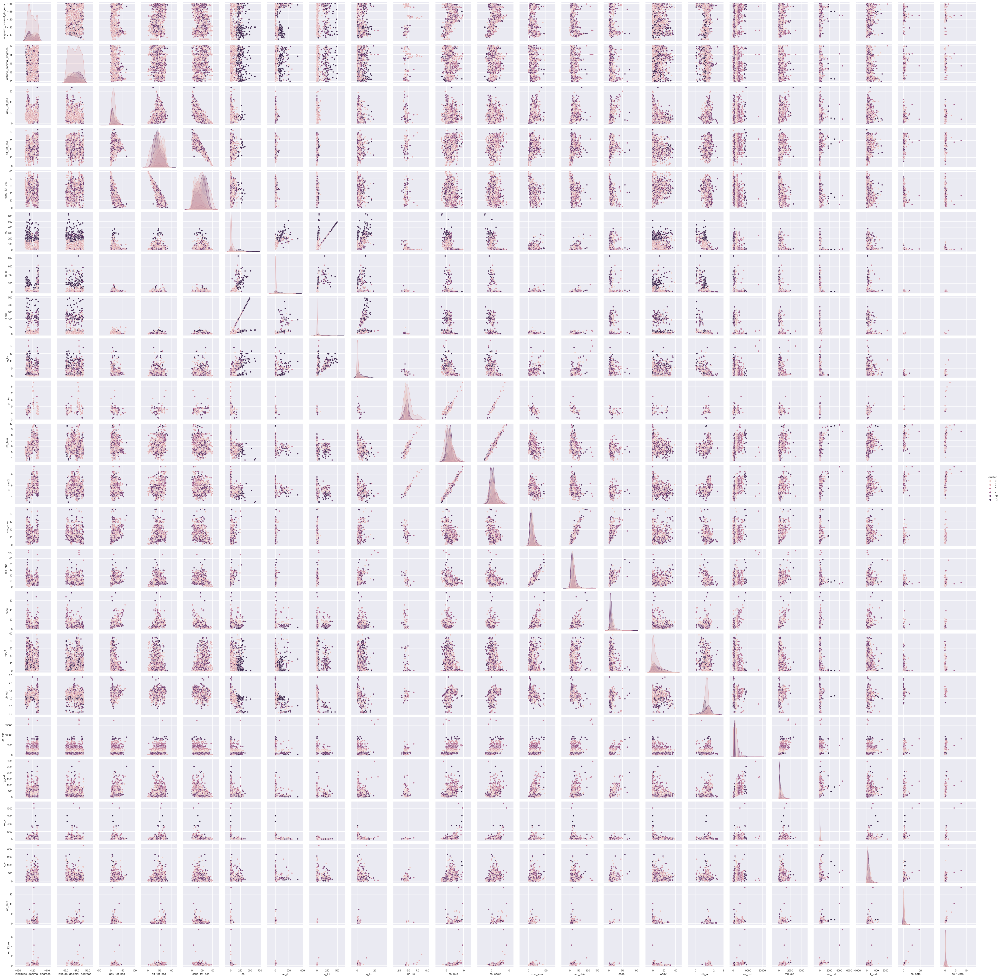

In [21]:
pairplot = sns.pairplot(clustered_dataset, hue='cluster')
pairplot.savefig('soil_pairplot_clustered2.png')
